In [1]:
from credit_risk_lab.config.settings import settings

print("Project Name:", settings.project_name)
print("Version:", settings.project_version)
print("Project Root:", settings.project_root)
print("Data Directory:", settings.data_dir)
print("Models Directory:", settings.models_dir)
print("Logs Directory:", settings.logs_dir)
#print("Description:", settings.description)


Project Name: Credit Risk Lab
Version: 0.1.0
Project Root: /Users/surelmanda/Downloads/ml-projects/credit-risk-lab
Data Directory: /Users/surelmanda/Downloads/ml-projects/credit-risk-lab/data
Models Directory: /Users/surelmanda/Downloads/ml-projects/credit-risk-lab/models
Logs Directory: /Users/surelmanda/Downloads/ml-projects/credit-risk-lab/logs


In [2]:
import pandas as pd

file_path = "/Users/surelmanda/Downloads/ml-projects/credit-risk-lab/data/processed/train.csv"
df = pd.read_csv(file_path)

display(df.head())

,person_age,person_gender,person_education,person_income,person_emp_exp,person_home_ownership,loan_amnt,loan_intent,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,loan_status
0,24.0,male,Master,58914.0,2,OWN,4400.0,VENTURE,5.99,0.07,4.0,656,Yes,0
1,23.0,female,High School,45873.0,2,RENT,11000.0,VENTURE,11.01,0.24,2.0,634,Yes,0
2,29.0,female,Master,240947.0,7,MORTGAGE,10000.0,VENTURE,12.69,0.04,9.0,638,Yes,0
3,30.0,female,Bachelor,96316.0,10,MORTGAGE,6000.0,MEDICAL,13.49,0.06,8.0,682,No,0
4,29.0,male,Bachelor,73033.0,7,MORTGAGE,8000.0,PERSONAL,10.51,0.11,8.0,644,Yes,0


In [9]:
from credit_risk_lab.infrastructure.data_sources import CSVDatasetRepository

csv_repo = CSVDatasetRepository(
    name_file="loan_data.csv",
    name_folder="raw"
)
df = csv_repo.load()

df.head()

2025-11-28 14:17:41 | INFO     | [CSVDatasetRepository] - Chargement du fichier : /Users/surelmanda/Downloads/ml-projects/credit-risk-lab/data/raw/loan_data.csv
2025-11-28 14:17:41 | INFO     | [CSVDatasetRepository] - Dataset chargé (45000 lignes, 14 colonnes)


,person_age,person_gender,person_education,person_income,person_emp_exp,person_home_ownership,loan_amnt,loan_intent,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,loan_status
0,22.0,female,Master,71948.0,0,RENT,35000.0,PERSONAL,16.02,0.49,3.0,561,No,1
1,21.0,female,High School,12282.0,0,OWN,1000.0,EDUCATION,11.14,0.08,2.0,504,Yes,0
2,25.0,female,High School,12438.0,3,MORTGAGE,5500.0,MEDICAL,12.87,0.44,3.0,635,No,1
3,23.0,female,Bachelor,79753.0,0,RENT,35000.0,MEDICAL,15.23,0.44,2.0,675,No,1
4,24.0,male,Master,66135.0,1,RENT,35000.0,MEDICAL,14.27,0.53,4.0,586,No,1


In [1]:
from credit_risk_lab.application import SplitDatasetUseCase
from credit_risk_lab.infrastructure.data_sources import CSVDatasetRepository


csv_repo = CSVDatasetRepository(name_file="loan_data.csv",name_folder="raw")
split_uc = SplitDatasetUseCase(dataset_repo=csv_repo)
train_df, test_df = split_uc.execute(test_size=0.2, random_state=42, save=True)

2025-11-28 16:00:23 | INFO     | SplitDatasetUseCase | credit_risk_lab.application.split_dataset_uc:execute:28 - Loading dataset via DatasetRepositoryPort...
2025-11-28 16:00:23 | INFO     | CSVDatasetRepository | credit_risk_lab.infrastructure.data_sources.csv_dataset_repository:load:61 - Chargement du fichier : /Users/surelmanda/Downloads/ml-projects/credit-risk-lab/data/raw/loan_data.csv
2025-11-28 16:00:23 | INFO     | CSVDatasetRepository | credit_risk_lab.infrastructure.data_sources.csv_dataset_repository:load:72 - Dataset chargé (45000 lignes, 14 colonnes)
2025-11-28 16:00:23 | INFO     | SplitDatasetUseCase | credit_risk_lab.application.split_dataset_uc:execute:30 - Dataset loaded successfully.
2025-11-28 16:00:23 | INFO     | SplitDatasetUseCase | credit_risk_lab.application.split_dataset_uc:execute:35 - Splitting dataset: test_size=0.2, random_state=42, target_column=loan_status
2025-11-28 16:00:23 | INFO     | SplitDatasetUseCase | credit_risk_lab.application.split_dataset_u

In [1]:
from credit_risk_lab.infrastructure.analytics import DataAnalyzer, DriftAnalyzer
from credit_risk_lab.infrastructure.data_sources import CSVDatasetRepository

csv_repo = CSVDatasetRepository(
    name_file="loan_data.csv",
    name_folder="raw"
)
df = csv_repo.load()

analyzer = DataAnalyzer(df)
summary = analyzer.summarize_dataset(max_examples=5)
display(summary)


numeric_cols, categorical_cols = analyzer.identify_feature_types()
print("Numériques :", numeric_cols[:10])
print("Catégorielles :", categorical_cols[:10])



2025-11-28 16:35:06 | INFO     | CSVDatasetRepository | credit_risk_lab.infrastructure.data_sources.csv_dataset_repository:load:61 - Chargement du fichier : /Users/surelmanda/Downloads/ml-projects/credit-risk-lab/data/raw/loan_data.csv
2025-11-28 16:35:06 | INFO     | CSVDatasetRepository | credit_risk_lab.infrastructure.data_sources.csv_dataset_repository:load:72 - Dataset chargé (45000 lignes, 14 colonnes)
2025-11-28 16:35:06 | INFO     | data_analyzer | credit_risk_lab.infrastructure.analytics.data_analysis:summarize_dataset:36 - Génération du résumé du dataset...
2025-11-28 16:35:06 | INFO     | data_analyzer | credit_risk_lab.infrastructure.analytics.data_analysis:summarize_dataset:68 - Résumé terminé : 14 colonnes, 45000 lignes.


,Column,Type,Missing,% Missing,Cardinality,Examples
0,person_age,float64,0,0.0,60,"[21.0, 22.0, 23.0, 24.0, 25.0]"
1,person_gender,object,0,0.0,2,"[female, male]"
2,person_education,object,0,0.0,5,"[Master, High School, Bachelor, Associate, Doc..."
3,person_income,float64,0,0.0,33989,"[12282.0, 12438.0, 66135.0, 71948.0, 79753.0]"
4,person_emp_exp,int64,0,0.0,63,"[0, 1, 3, 4, 5]"
5,person_home_ownership,object,0,0.0,4,"[RENT, OWN, MORTGAGE, OTHER]"
6,loan_amnt,float64,0,0.0,4483,"[1000.0, 1600.0, 2500.0, 5500.0, 35000.0]"
7,loan_intent,object,0,0.0,6,"[PERSONAL, EDUCATION, MEDICAL, VENTURE, HOMEIM..."
8,loan_int_rate,float64,0,0.0,1302,"[11.14, 12.87, 14.27, 15.23, 16.02]"
9,loan_percent_income,float64,0,0.0,64,"[0.08, 0.19, 0.44, 0.49, 0.53]"


2025-11-28 16:35:06 | INFO     | data_analyzer | credit_risk_lab.infrastructure.analytics.data_analysis:identify_feature_types:96 - Identification des types de variables terminée.
2025-11-28 16:35:06 | INFO     | data_analyzer | credit_risk_lab.infrastructure.analytics.data_analysis:identify_feature_types:97 - Numériques (9): ['person_age', 'person_income', 'person_emp_exp', 'loan_amnt', 'loan_int_rate'] ...
2025-11-28 16:35:06 | INFO     | data_analyzer | credit_risk_lab.infrastructure.analytics.data_analysis:identify_feature_types:100 - Catégorielles (5): ['person_gender', 'person_education', 'person_home_ownership', 'loan_intent', 'previous_loan_defaults_on_file']
Numériques : ['person_age', 'person_income', 'person_emp_exp', 'loan_amnt', 'loan_int_rate', 'loan_percent_income', 'cb_person_cred_hist_length', 'credit_score', 'loan_status']
Catégorielles : ['person_gender', 'person_education', 'person_home_ownership', 'loan_intent', 'previous_loan_defaults_on_file']


In [2]:
analyzer.plot_target_distribution(target_col="loan_status")

2025-11-28 16:35:16 | INFO     | data_analyzer | credit_risk_lab.infrastructure.analytics.data_analysis:plot_target_distribution:201 - Visualisation complète affichée pour la cible 'loan_status'.


In [ ]:
# Loan Approval Classification Dataset
# https://www.kaggle.com/datasets/taweilo/loan-approval-classification-data


In [ ]:
"""
https://www.kaggle.com/datasets/taweilo/loan-approval-classification-data/data
https://www.kaggle.com/code/nourahmed1/loanlens-eda-driven-approval-prediction
https://www.kaggle.com/code/solimanalsayed/battle-of-mlclassification-algorithms
https://www.kaggle.com/code/hagergamalabdelazim/loan-approval-prediction-with-random-forest
https://www.kaggle.com/code/ahmedismaiil/loan-approval-classification-app-92-mlflow


https://medium.com/@saygiligozde/why-is-rest-api-is-so-popular-ed9ca370b541
https://github.com/ahmedismaiill/ML-Projects-with-MLflow/tree/main/Loan%20Approval%20Classification


Scikit-learn Pipelines Explained: Streamline and Optimize Your Machine Learning Processes
https://medium.com/@sahin.samia/scikit-learn-pipelines-explained-streamline-and-optimize-your-machine-learning-processes-f17b1beb86a4


Gradient Descent Explained: The Engine Behind AI Training
https://medium.com/@abhaysingh71711/gradient-descent-explained-the-engine-behind-ai-training-2d8ef6ecad6f


Comprehensive Guide to MLOps on Databricks
https://www.youtube.com/watch?v=U637m2oXYYs

14. End to End MLOps Portfolio Project | MLOps | DVC Pipeline | MLflow
https://www.youtube.com/watch?v=ubnbC5ZkykY&t=4278s

#MLOps : pipelines de livraison
https://cloud.google.com/architecture/mlops-continuous-delivery-and-automation-pipelines-in-machine-learning?hl=fr
"""

## Questions d'entretiens d'embauches 

### SECTION 1 — Import, inspection, compréhension globale (très simple)

Data Directory: /Users/surelmanda/Downloads/ml-projects/credit-risk-lab/data
Path to loan_data.csv: /Users/surelmanda/Downloads/ml-projects/credit-risk-lab/data/raw/loan_data.csv


In [63]:
import pandas as pd
from credit_risk_lab.config.settings import settings

# print("Data Directory:", settings.data_dir)
path_data = settings.data_dir / "raw" / "loan_data.csv"
# print("Path to loan_data.csv:", path_data)

df = pd.read_csv(path_data)
display(df.head())

print("Le dataset contient", df.shape[0], "lignes et", df.shape[1], "colonnes.")
print("La liste des colonnes du dataset est :",df.columns.tolist())

print("\n")
print("afficher le type de chaque colonne:",df.dtypes)

print("\n")
print("Verification des colonnes avec des valeurs manquantes:\n", df.isnull().sum())
print("\n")
print("Verifier que les aucune colonne a des valeu manquantes", df.isnull().sum().sum())

print("\n")
print("Statistiques descriptives des colonnes numériques:")
display(df.describe().T)

,person_age,person_gender,person_education,person_income,person_emp_exp,person_home_ownership,loan_amnt,loan_intent,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,loan_status
0,22.0,female,Master,71948.0,0,RENT,35000.0,PERSONAL,16.02,0.49,3.0,561,No,1
1,21.0,female,High School,12282.0,0,OWN,1000.0,EDUCATION,11.14,0.08,2.0,504,Yes,0
2,25.0,female,High School,12438.0,3,MORTGAGE,5500.0,MEDICAL,12.87,0.44,3.0,635,No,1
3,23.0,female,Bachelor,79753.0,0,RENT,35000.0,MEDICAL,15.23,0.44,2.0,675,No,1
4,24.0,male,Master,66135.0,1,RENT,35000.0,MEDICAL,14.27,0.53,4.0,586,No,1


Le dataset contient 45000 lignes et 14 colonnes.
La liste des colonnes du dataset est : ['person_age', 'person_gender', 'person_education', 'person_income', 'person_emp_exp', 'person_home_ownership', 'loan_amnt', 'loan_intent', 'loan_int_rate', 'loan_percent_income', 'cb_person_cred_hist_length', 'credit_score', 'previous_loan_defaults_on_file', 'loan_status']


afficher le type de chaque colonne: person_age                        float64
person_gender                      object
person_education                   object
person_income                     float64
person_emp_exp                      int64
person_home_ownership              object
loan_amnt                         float64
loan_intent                        object
loan_int_rate                     float64
loan_percent_income               float64
cb_person_cred_hist_length        float64
credit_score                        int64
previous_loan_defaults_on_file     object
loan_status                         int64
dtype: obje

,count,mean,std,min,25%,50%,75%,max
person_age,45000.0,27.764178,6.045108,20.00,24.00,26.00,30.00,144.00
person_income,45000.0,80319.053222,80422.498632,8000.00,47204.00,67048.00,95789.25,7200766.00
person_emp_exp,45000.0,5.410333,6.063532,0.00,1.00,4.00,8.00,125.00
loan_amnt,45000.0,9583.157556,6314.886691,500.00,5000.00,8000.00,12237.25,35000.00
loan_int_rate,45000.0,11.006606,2.978808,5.42,8.59,11.01,12.99,20.00
loan_percent_income,45000.0,0.139725,0.087212,0.00,0.07,0.12,0.19,0.66
cb_person_cred_hist_length,45000.0,5.867489,3.879702,2.00,3.00,4.00,8.00,30.00
credit_score,45000.0,632.608756,50.435865,390.00,601.00,640.00,670.00,850.00
loan_status,45000.0,0.222222,0.415744,0.00,0.00,0.00,0.00,1.00


In [66]:
import numpy as np

print("Liste des premiers elements de la colonne ages:", df["person_age"].values.tolist()[:10])
print("\n")

print("Liste des colonnes numeriques :", df.select_dtypes(include=np.number).columns.tolist())
print("Liste des colonnes categoricielles :", df.select_dtypes(exclude=np.number).columns.tolist())

print("\n")
print("compiute the mean age of the persons in the dataset:", df["person_age"].mean())

print("\n")
print("compute the median age of the persons in the dataset:", df["person_age"].median())

print("\n")
print("compute the mode of the person_age column:", df["person_age"].mode()[0])

print("\n")
print("le max de la person_age column:", df["person_age"].max())
print("Le min de la person_age column:", df["person_age"].min())

Liste des premiers elements de la colonne ages: [22.0, 21.0, 25.0, 23.0, 24.0, 21.0, 26.0, 24.0, 24.0, 21.0]


Liste des colonnes numeriques : ['person_age', 'person_income', 'person_emp_exp', 'loan_amnt', 'loan_int_rate', 'loan_percent_income', 'cb_person_cred_hist_length', 'credit_score', 'loan_status']
Liste des colonnes categoricielles : ['person_gender', 'person_education', 'person_home_ownership', 'loan_intent', 'previous_loan_defaults_on_file']


compiute the mean age of the persons in the dataset: 27.76417777777778


compute the median age of the persons in the dataset: 26.0


compute the mode of the person_age column: 23.0


le max de la person_age column: 144.0
Le min de la person_age column: 20.0


# ANALYSE UNIVARIÉE

In [ ]:
import plotly.express as px
#import plotly.io as pio
#pio.renderers.default = "notebook_connected"

df_plot = df.groupby(["person_education", "loan_status"]).size().reset_index(name="count")

fig = px.bar(
    df_plot,
    x="person_education",
    y="count",
    color="loan_status",
    barmode="stack",
    title="Répartition de loan_status par niveau d'éducation"
)

fig.show()


In [9]:
import plotly.express as px

heatmap_df = df_plot.pivot(index="person_education", columns="loan_status", values="count")

fig = px.imshow(
    heatmap_df,
    text_auto=True,
    color_continuous_scale="Blues",
    title="Heatmap : loan_status par niveau d'éducation"
)

fig.show()


In [21]:
import numpy as np
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from scipy.stats import gaussian_kde

# -------- Données --------
s = df["person_age"].dropna()

# KDE 1D
x_kde = np.linspace(s.min(), s.max(), 200)
kde = gaussian_kde(s)
y_kde = kde(x_kde)

# Subplots
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("Distribution de l'âge", "Boxplot de l'âge")
)

# --- 1) Histogramme (densité) ---
hist_fig = px.histogram(
    df,
    x="person_age",
    nbins=30,
    histnorm="probability density",
    opacity=0.6
)

for trace in hist_fig.data:
    fig.add_trace(trace, row=1, col=1)

# Courbe KDE par-dessus
fig.add_trace(
    go.Scatter(
        x=x_kde,
        y=y_kde,
        mode="lines",
        line=dict(width=2),
        name="KDE"
    ),
    row=1, col=1
)

# --- 2) Boxplot horizontal ---
box_fig = px.box(
    df,
    x="person_age",
    points="outliers"
)
for trace in box_fig.data:
    fig.add_trace(trace, row=1, col=2)

# Layout
fig.update_layout(
    width=1200,
    height=450,
    showlegend=False
)

fig.show()


In [5]:
import plotly.graph_objects as go

df_plot = df.groupby(["person_education", "loan_status"]).size().reset_index(name="count")

# Séparer les deux classes
df0 = df_plot[df_plot["loan_status"] == 0]
df1 = df_plot[df_plot["loan_status"] == 1]

fig = go.Figure()

fig.add_trace(go.Bar(
    x=df0["person_education"],
    y=df0["count"],
    name="loan_status = 0"
))

fig.add_trace(go.Bar(
    x=df1["person_education"],
    y=df1["count"],
    name="loan_status = 1"
))

fig.update_layout(
    barmode="group",   # <-- ICI (group au lieu de stack)
    title="Répartition du loan_status par niveau d'éducation",
    xaxis_title="Niveau d'éducation",
    yaxis_title="Nombre"
)

fig.show()


# 3.1 — Distribution des variables numériques

In [20]:
numeric_cols = [col for col in df.select_dtypes(include="number").columns.tolist() if col != "loan_status"]

for col in numeric_cols:
    fig = make_subplots(rows=1, cols=2, subplot_titles=(f"Distribution de {col}", f"Boxplot de {col}"))

    # Histogramme
    hist = px.histogram(df, x=col, nbins=30, opacity=0.7)
    for trace in hist.data:
        fig.add_trace(trace, row=1, col=1)

    # Boxplot
    box = px.box(df, x=col)
    for trace in box.data:
        fig.add_trace(trace, row=1, col=2)

    fig.update_layout(width=1100, height=350, showlegend=False)
    fig.show()


# 4. ANALYSE BIVARIÉE AVEC loan_status

## 4.1 — Variables catégorielles vs loan_status

In [14]:
cat_cols = df.select_dtypes(exclude="number").columns

for col in cat_cols:
    fig = px.histogram(
        df,
        x=col,
        color="loan_status",
        barmode="group",
        title=f"{col} vs loan_status"
    )
    fig.show()


In [17]:
numeric_cols = [col for col in df.select_dtypes(include="number").columns.tolist() if col != "loan_status"]
for col in numeric_cols:
    fig = px.box(
        df,
        x="loan_status",
        y=col,
        color="loan_status",
        title=f"{col} distribution by loan_status"
    )
    fig.show()


# 5. MATRICE DE CORRÉLATION (numérique)

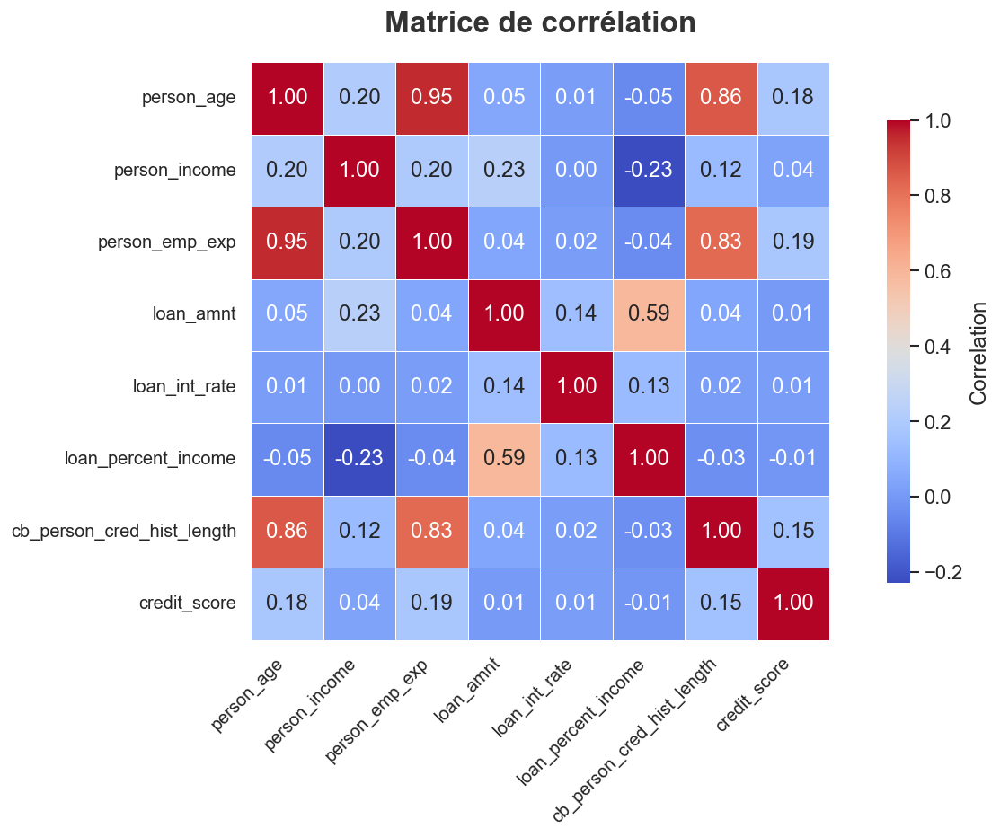

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Style général
plt.style.use("seaborn-v0_8-darkgrid")

# Matrice de corrélation
corr = df[numeric_cols].corr()

# Figure
plt.figure(figsize=(12, 8), dpi=120)
sns.set(font_scale=1.2)

# Heatmap stylée
ax = sns.heatmap(
    corr,
    cmap="coolwarm",                # dégradé moderne
    annot=True,                     # afficher les valeurs
    fmt=".2f",
    linewidths=0.5,                 # lignes fines entre cases
    linecolor="white",
    cbar=True,
    square=True,                    # cases carrées = plus clean
    cbar_kws={
        "shrink": 0.8,
        "label": "Correlation",
    }
)

# Titre premium
plt.title(
    "Matrice de corrélation",
    fontsize=20,
    fontweight="bold",
    pad=20,
    color="#333"
)

# Labels stylés
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", fontsize=12)
ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=12)

# Marges élégantes
plt.tight_layout()

plt.show()


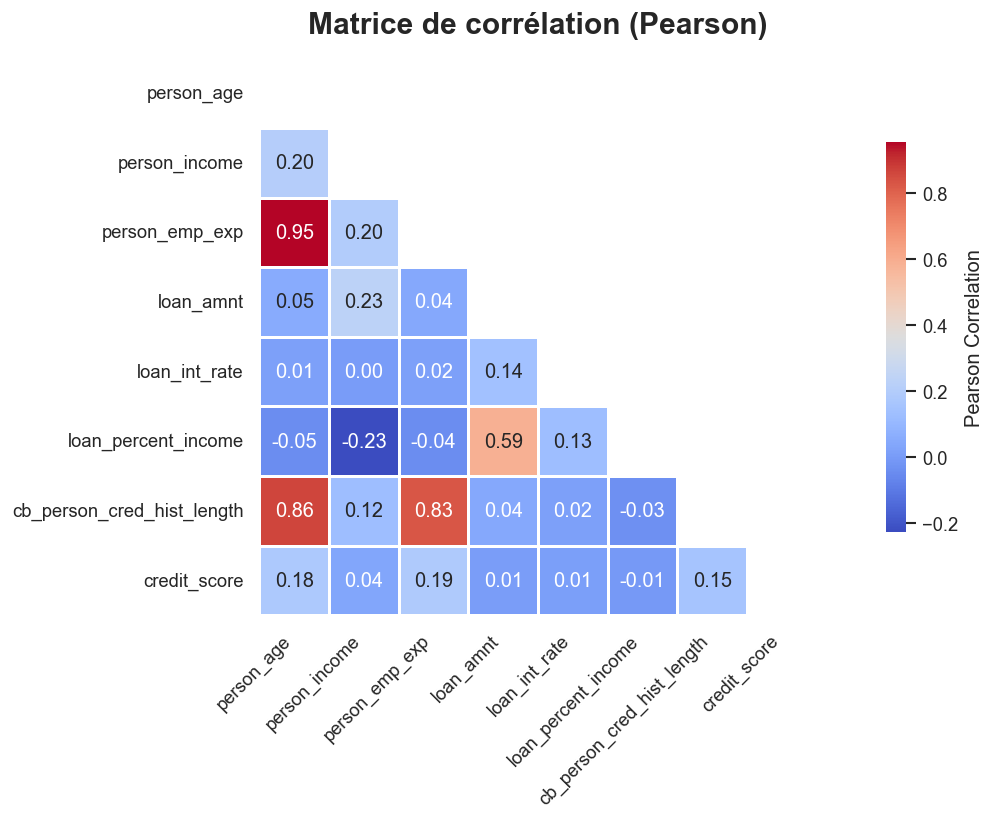

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

corr_pearson = df[numeric_cols].corr(method="pearson")

plt.figure(figsize=(12, 7), dpi=120)
sns.set_theme(style="white")

# masque triangulaire
mask = np.triu(np.ones_like(corr_pearson, dtype=bool))

ax = sns.heatmap(
    corr_pearson,
    mask=mask,
    cmap="coolwarm",
    annot=True,
    fmt=".2f",
    linewidths=0.8,
    linecolor="white",
    cbar_kws={"shrink": .7, "label": "Pearson Correlation"},
    square=True
)

plt.title("Matrice de corrélation (Pearson)", fontsize=18, fontweight="bold", pad=15)
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()

plt.show()


# SECTION 5 — GroupBy et agrégations

In [58]:
# Comment calculer le revenu moyen par genre ?
print(df.groupby("person_gender")["person_income"].mean())

person_gender
female    79410.904856
male      81056.034942
Name: person_income, dtype: float64


In [59]:
# Comment calculer le revenu moyen par genre ?
print(df.groupby(["person_gender"])["person_income"].mean())
print("------\n")

person_gender
female    79410.904856
male      81056.034942
Name: person_income, dtype: float64
------



In [60]:
# Comment calculer le montant moyen du prêt par type d’intention (loan_intent) ?
print(df.groupby("loan_intent")["loan_amnt"].mean())
print("------\n")

loan_intent
DEBTCONSOLIDATION     9548.333660
EDUCATION             9507.405987
HOMEIMPROVEMENT      10419.187330
MEDICAL               9137.959172
PERSONAL              9603.918432
VENTURE               9658.897429
Name: loan_amnt, dtype: float64
------



In [61]:
# Comment calculer le taux de défaut (loan_status) par niveau d’éducation ?
print(df.groupby("person_education")["loan_status"].value_counts(normalize=True).unstack())
print("------\n")

loan_status              0         1
person_education                    
Associate         0.779681  0.220319
Bachelor          0.774759  0.225241
Doctorate         0.771337  0.228663
High School       0.776896  0.223104
Master            0.782378  0.217622
------



In [62]:
# Comment calculer la moyenne des taux d’intérêt par type de logement ?
print(df.groupby("person_home_ownership")["loan_int_rate"].mean())
print("------\n")


person_home_ownership
MORTGAGE    10.557747
OTHER       12.032991
OWN         10.827231
RENT        11.378069
Name: loan_int_rate, dtype: float64
------



In [ ]:
# Comment grouper par tranche d’âge (ex. <30, 30–50, >50) et calculer le prêt moyen ?

data = df.copy(deep=True)
# 1. Créer la colonne de tranches d'âge
data["age_group"] = pd.cut(
    df["person_age"], 
    bins=[0, 30, 50, 100], 
    labels=["<30", "30-50", ">50"]
)

# 2. Grouper par tranche d'âge et calculer la moyenne du prêt
pret_moyen_par_age = data.groupby("age_group", observed=True)["loan_amnt"].mean() # data.groupby("age_group")["loan_amnt"].mean()

print(pret_moyen_par_age)

age_group
<30       9485.046193
30-50     9894.925046
>50      10122.127726
Name: loan_amnt, dtype: float64


In [69]:
import pandas as pd

# Supposons que 'df' est votre DataFrame original
# data = df.copy(deep=True) # J'utilise directement le df copié dans le bloc

# 1. Créer la colonne de tranches d'âge
data["age_group"] = pd.cut(
    df["person_age"], 
    bins=[0, 30, 50, 100], 
    labels=["<30", "30-50", ">50"]
)

# 2. Calculer le montant TOTAL du prêt (SOMME) pour chaque groupe
pret_somme_par_age = data.groupby("age_group", observed=True)["loan_amnt"].sum().reset_index()

# Renommer la colonne pour plus de clarté
pret_somme_par_age.rename(columns={'loan_amnt': 'loan_amnt_sum'}, inplace=True)

# 3. Calculer le montant TOTAL de tous les prêts
total_global_pret = pret_somme_par_age['loan_amnt_sum'].sum()

# 4. Calculer la colonne de pourcentage
pret_somme_par_age['percentage'] = (pret_somme_par_age['loan_amnt_sum'] / total_global_pret) * 100

# 5. Afficher le résultat
print("--- Montant Total des Prêts et Pourcentage par Tranche d'Âge ---")
print(pret_somme_par_age)

--- Montant Total des Prêts et Pourcentage par Tranche d'Âge ---
  age_group  loan_amnt_sum  percentage
0       <30    326276104.0   75.671234
1     30-50    101650565.0   23.575198
2       >50      3249203.0    0.753568


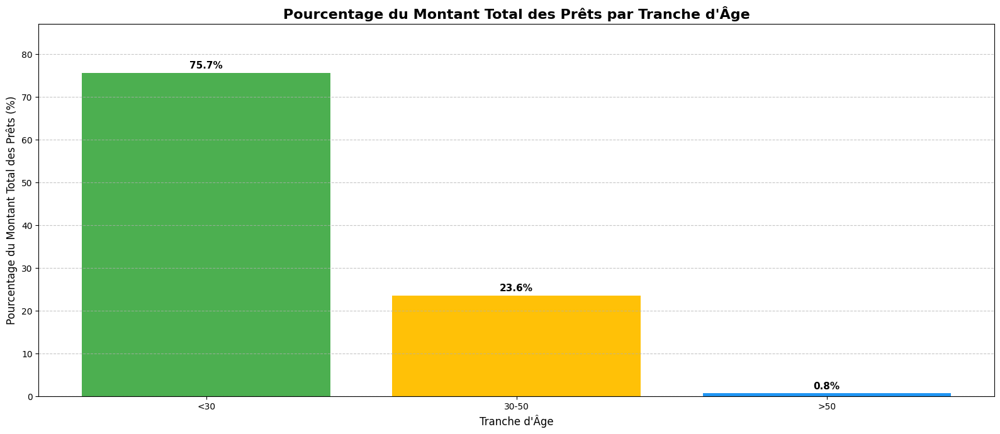

In [77]:
import matplotlib.pyplot as plt

# ----------------------------------------------------------------------
# PARTIE VISUALISATION (DIAGRAMME À BARRES)
# ----------------------------------------------------------------------

plt.figure(figsize=(16, 7))

# Créer le diagramme à barres pour les pourcentages
bars = plt.bar(
    pret_somme_par_age['age_group'], 
    pret_somme_par_age['percentage'], 
    color=['#4CAF50', '#FFC107', '#2196F3'] # Couleurs personnalisées
)

# Ajouter les titres et les labels
plt.title('Pourcentage du Montant Total des Prêts par Tranche d\'Âge', fontsize=16, fontweight='bold')
plt.xlabel('Tranche d\'Âge', fontsize=12)
plt.ylabel('Pourcentage du Montant Total des Prêts (%)', fontsize=12)
plt.xticks(rotation=0)
plt.yticks(fontsize=10) # Taille de police pour les ticks de l'axe y

# Ajouter les pourcentages au-dessus des barres
for bar in bars:
    yval = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width()/2, 
        yval + 0.5, # Positionner légèrement au-dessus de la barre
        f'{yval:.1f}%', # Formater à 1 décimale avec le signe %
        ha='center', 
        va='bottom', 
        fontsize=11, 
        fontweight='bold'
    )

# Ajouter une grille et ajuster la mise en page
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.ylim(0, pret_somme_par_age['percentage'].max() * 1.15) # Ajuster la limite supérieure pour les labels
plt.tight_layout()

# Afficher le graphique
plt.show()

In [79]:
print("Liste des colonnes numeriques :", df.select_dtypes(include=np.number).columns.tolist())
print("Liste des colonnes categoricielles :", df.select_dtypes(exclude=np.number).columns.tolist())

Liste des colonnes numeriques : ['person_age', 'person_income', 'person_emp_exp', 'loan_amnt', 'loan_int_rate', 'loan_percent_income', 'cb_person_cred_hist_length', 'credit_score', 'loan_status']
Liste des colonnes categoricielles : ['person_gender', 'person_education', 'person_home_ownership', 'loan_intent', 'previous_loan_defaults_on_file']


In [87]:
# Comment calculer la médiane du revenu par statut de défaut antérieur ?
print(df.groupby("previous_loan_defaults_on_file")["person_income"].median())
print("------\n")

# Comment calculer la distribution du score de crédit par type de prêt ?
print(df.groupby("loan_intent")["credit_score"].describe())
print("------\n")

# Comment grouper par loan_intent et compter le nombre de prêts ?
print(df["loan_intent"].value_counts())
print("------\n")

# Comment calculer le ratio prêt/revenu moyen par groupe ?
data["loan_to_income_ratio"] = df["loan_amnt"] / df["person_income"]
print(data.groupby("loan_intent")["loan_to_income_ratio"].mean())
print("------\n")

# Comment créer une table croisée entre genre et statut du prêt ?
print(pd.crosstab(df["person_gender"], df["loan_status"]))
print("------\n")

previous_loan_defaults_on_file
No     62322.5
Yes    72861.0
Name: person_income, dtype: float64
------

                    count        mean        std    min    25%    50%    75%  \
loan_intent                                                                    
DEBTCONSOLIDATION  7145.0  631.553254  50.559573  390.0  599.0  638.0  669.0   
EDUCATION          9153.0  631.060854  51.256263  418.0  601.0  639.0  668.0   
HOMEIMPROVEMENT    4783.0  634.104537  50.349348  420.0  604.0  641.0  671.0   
MEDICAL            8548.0  632.958587  50.279894  419.0  602.0  640.0  670.0   
PERSONAL           7552.0  633.034958  50.293959  421.0  602.0  640.0  670.0   
VENTURE            7819.0  633.676173  49.658787  430.0  602.0  641.0  670.0   

                     max  
loan_intent               
DEBTCONSOLIDATION  764.0  
EDUCATION          807.0  
HOMEIMPROVEMENT    768.0  
MEDICAL            784.0  
PERSONAL           850.0  
VENTURE            792.0  
------

loan_intent
EDUCATION         

<Axes: xlabel='loan_intent', ylabel='credit_score'>

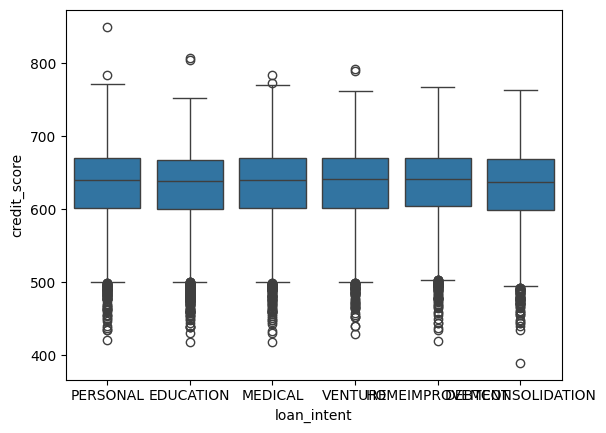

In [88]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.boxplot(data=df, x="loan_intent", y="credit_score")

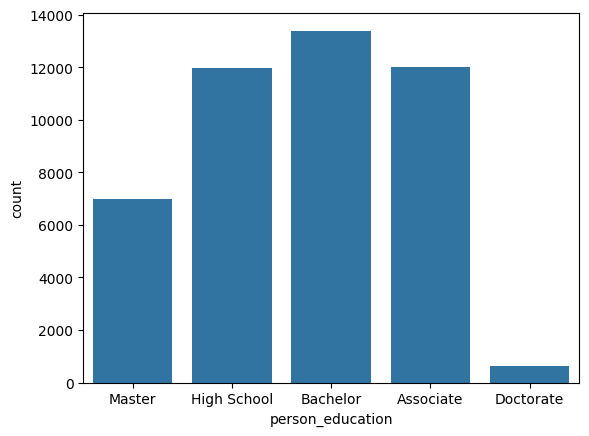

In [ ]:
sns.countplot(x=df["person_education"])



<Axes: >

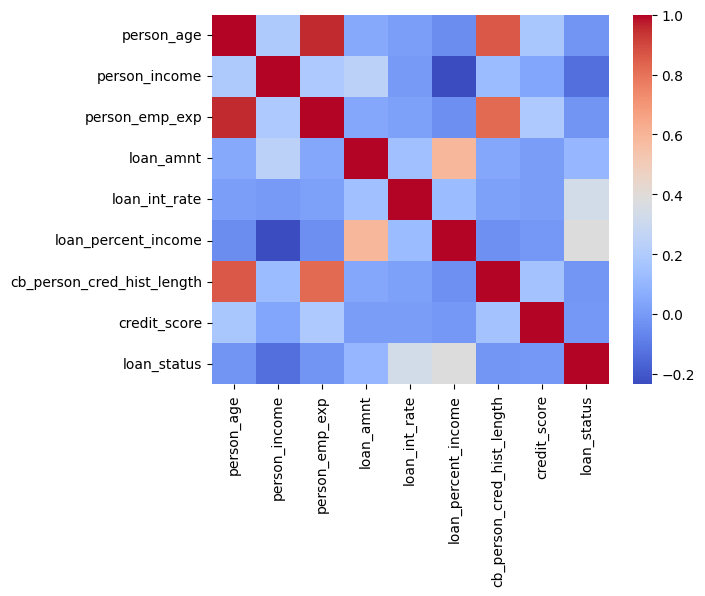

In [92]:
numeric_cols = df.select_dtypes(include=np.number).columns.tolist()
sns.heatmap(df[numeric_cols].corr(), annot=False, cmap="coolwarm")


<Axes: xlabel='person_gender', ylabel='loan_int_rate'>

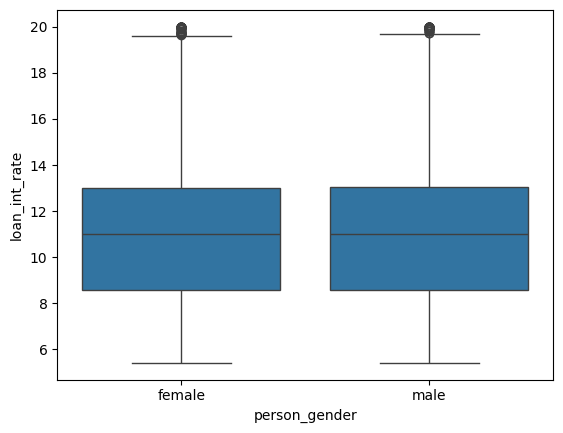

In [93]:
sns.boxplot(data=df, x="person_gender", y="loan_int_rate")

In [95]:
df[numeric_cols].corr()["loan_status"].sort_values(ascending=False)

loan_status                   1.000000
loan_percent_income           0.384880
loan_int_rate                 0.332005
loan_amnt                     0.107714
credit_score                 -0.007647
cb_person_cred_hist_length   -0.014851
person_emp_exp               -0.020481
person_age                   -0.021476
person_income                -0.135808
Name: loan_status, dtype: float64

In [100]:
df.select_dtypes(exclude="number").columns.tolist()

['person_gender',
 'person_education',
 'person_home_ownership',
 'loan_intent',
 'previous_loan_defaults_on_file']

In [98]:
num_cols = df.select_dtypes(include="number").columns.tolist()
num_cols

['person_age',
 'person_income',
 'person_emp_exp',
 'loan_amnt',
 'loan_int_rate',
 'loan_percent_income',
 'cb_person_cred_hist_length',
 'credit_score',
 'loan_status']